In [1]:
!pip install pyarrow

In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib import patches as patches
import seaborn as sns
import os
import pygwalker as pyg
import math

# Read Data

In [3]:
# df = pd.read_parquet('./dataframe_graphs/v1/detail_stat_v1.parquet')
# df_agg = pd.read_parquet('./dataframe_graphs/v1/detail_agg_stat_v1.parquet')
df = pd.read_parquet('./dataframe_graphs/v2/detail_stat_noflow.parquet')
df_agg = pd.read_parquet('./dataframe_graphs/v2/detail_agg_stat_noflow.parquet')
df_agg_v1 = pd.read_parquet('./dataframe_graphs/v1/detail_agg_stat_noflow.parquet')
# df = pd.read_parquet('./dataframe_graphs/v1/detail_stat_noflow.parquet')
# df_agg = pd.read_parquet('./dataframe_graphs/v1/detail_agg_stat_noflow.parquet')

df_agg_flow = pd.read_parquet('./dataframe_graphs/v2/detail_agg_stat.parquet')
df_agg_flow_v1 = pd.read_parquet('./dataframe_graphs/v1/detail_agg_stat_v1.parquet')
df_resource_agg = pd.read_parquet('./dataframe_graphs/v2/resources_agg_stat.parquet')
df_resource = pd.read_parquet('./dataframe_graphs/v2/resources_stat.parquet')
df_agg.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1386 entries, ('cluster', '1pod', 'ks_ks', 'initial', 1) to ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up', 100)
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   throughput_mean              1386 non-null   float64
 1   throughput_std               1386 non-null   float64
 2   response_time_ms_count_mean  1386 non-null   float64
 3   response_time_ms_count_std   1386 non-null   float64
 4   response_time_ms_mean_mean   1386 non-null   float64
 5   response_time_ms_mean_std    1386 non-null   float64
 6   response_time_ms_min_mean    1386 non-null   float64
 7   response_time_ms_min_std     1386 non-null   float64
 8   response_time_ms_max_mean    1386 non-null   float64
 9   response_time_ms_max_std     1386 non-null   float64
 10  response_time_ms_25%_mean    1386 non-null   float64
 11  response_time_ms_25%_std     1386 non-null 

In [4]:
df_agg.head()

throughput_mean  \
topology deployment sorting scenario num_users                    
cluster  1pod       ks_ks   initial  1                17.456667   
                                     10               54.573333   
                                     20               52.836667   
                                     30               53.323333   
                                     40               53.143333   

                                                throughput_std  \
topology deployment sorting scenario num_users                   
cluster  1pod       ks_ks   initial  1                0.229895   
                                     10               0.743997   
                                     20               0.762136   
                                     30               0.690330   
                                     40               0.382664   

                                                response_time_ms_count_mean  \
topology deployment sorting scenario num_users                                
cluster  1pod       ks_ks   initial  1                                523.7   
                                     10                              1637.2   
                                     20                              1585.1   
                                     30                              1599.7   
                                     40                              1594.3   

                                                response_time_ms_count_std  \
topology deployment sorting scenario num_users                               
cluster  1pod       ks_ks   initial  1                            6.896859   
                                     10                          22.319896   
                                     20                          22.864091   
                                     30                          20.709901   
                                     40                          11.479934   

                                                response_time_ms_mean_mean  \
topology deployment sorting scenario num_users                               
cluster  1pod       ks_ks   initial  1                           53.382213   
                                     10                         192.372454   
                                     20                         388.153566   
                                     30                         578.546980   
                                     40                         775.355160   

                                                response_time_ms_mean_std  \
topology deployment sorting scenario num_users                              
cluster  1pod       ks_ks   initial  1                           0.658897   
                                     10                          2.583571   
                                     20                          5.290820   
                                     30                          7.905996   
                                     40                          5.609125   

                                                response_time_ms_min_mean  \
topology deployment sorting scenario num_users                              
cluster  1pod       ks_ks   initial  1                               23.7   
                                     10                              70.9   
                                     20                             230.5   
                                     30                             402.8   
                                     40                             543.8   

                                                response_time_ms_min_std  \
topology deployment sorting scenario num_users                             
cluster  1pod       ks_ks   initial  1                          0.483046   
                                     10                        13.819873   
                                     20                        15.421846   
       

In [298]:
vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1,"timezoneDisplayOffset":0},"encodings":{"dimensions":[{"dragId":"gw_R1ZW","fid":"topology","name":"topology","basename":"topology","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_SumL","fid":"deployment","name":"deployment","basename":"deployment","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_sj5O","fid":"sorting","name":"sorting","basename":"sorting","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_IL3C","fid":"scenario","name":"scenario","basename":"scenario","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_38mo","fid":"num_users","name":"num_users","basename":"num_users","semanticType":"quantitative","analyticType":"dimension","offset":0},{"dragId":"gw_w1QI","fid":"flow_type","name":"flow_type","basename":"flow_type","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_5iZT","fid":"throughput_mean","name":"throughput_mean","basename":"throughput_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_Yflr","fid":"throughput_std","name":"throughput_std","basename":"throughput_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_s2SX","fid":"response_time_ms_count_mean","name":"response_time_ms_count_mean","basename":"response_time_ms_count_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_IAqf","fid":"response_time_ms_count_std","name":"response_time_ms_count_std","basename":"response_time_ms_count_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_xCWP","fid":"response_time_ms_mean_mean","name":"response_time_ms_mean_mean","basename":"response_time_ms_mean_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_YL1-","fid":"response_time_ms_mean_std","name":"response_time_ms_mean_std","basename":"response_time_ms_mean_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_VwTH","fid":"response_time_ms_min_mean","name":"response_time_ms_min_mean","basename":"response_time_ms_min_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_X7Ow","fid":"response_time_ms_min_std","name":"response_time_ms_min_std","basename":"response_time_ms_min_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_TOHl","fid":"response_time_ms_max_mean","name":"response_time_ms_max_mean","basename":"response_time_ms_max_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_lrnl","fid":"response_time_ms_max_std","name":"response_time_ms_max_std","basename":"response_time_ms_max_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_QXhE","fid":"response_time_ms_25%_mean","name":"response_time_ms_25%_mean","basename":"response_time_ms_25%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_8jAw","fid":"response_time_ms_25%_std","name":"response_time_ms_25%_std","basename":"response_time_ms_25%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_szG1","fid":"response_time_ms_50%_mean","name":"response_time_ms_50%_mean","basename":"response_time_ms_50%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_Ou5N","fid":"response_time_ms_50%_std","name":"response_time_ms_50%_std","basename":"response_time_ms_50%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_d1N_","fid":"response_time_ms_60%_mean","name":"response_time_ms_60%_mean","basename":"response_time_ms_60%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_M8Jr","fid":"response_time_ms_60%_std","name":"response_time_ms_60%_std","basename":"response_time_ms_60%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_gmSc","fid":"response_time_ms_70%_mean","name":"response_time_ms_70%_mean","basename":"response_time_ms_70%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_QAy9","fid":"response_time_ms_70%_std","name":"response_time_ms_70%_std","basename":"response_time_ms_70%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_Sxo9","fid":"response_time_ms_75%_mean","name":"response_time_ms_75%_mean","basename":"response_time_ms_75%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_CUOw","fid":"response_time_ms_75%_std","name":"response_time_ms_75%_std","basename":"response_time_ms_75%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_oj-b","fid":"response_time_ms_80%_mean","name":"response_time_ms_80%_mean","basename":"response_time_ms_80%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_9Ph0","fid":"response_time_ms_80%_std","name":"response_time_ms_80%_std","basename":"response_time_ms_80%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_m_bq","fid":"response_time_ms_90%_mean","name":"response_time_ms_90%_mean","basename":"response_time_ms_90%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_CXDx","fid":"response_time_ms_90%_std","name":"response_time_ms_90%_std","basename":"response_time_ms_90%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_s7sm","fid":"response_time_ms_95%_mean","name":"response_time_ms_95%_mean","basename":"response_time_ms_95%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_SpG5","fid":"response_time_ms_95%_std","name":"response_time_ms_95%_std","basename":"response_time_ms_95%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_kOnU","fid":"response_time_ms_99%_mean","name":"response_time_ms_99%_mean","basename":"response_time_ms_99%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_B4Vo","fid":"response_time_ms_99%_std","name":"response_time_ms_99%_std","basename":"response_time_ms_99%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_0lH8","fid":"topology","name":"topology","basename":"topology","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_1QVf","fid":"flow_type","name":"flow_type","basename":"flow_type","semanticType":"nominal","analyticType":"dimension","offset":0}],"columns":[{"dragId":"gw_Epp8","fid":"deployment","name":"deployment","basename":"deployment","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_KHpy","fid":"response_time_ms_50%_mean","name":"response_time_ms_50%_mean","basename":"response_time_ms_50%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0}],"color":[{"dragId":"gw_t4vo","fid":"flow_type","name":"flow_type","basename":"flow_type","semanticType":"nominal","analyticType":"dimension","offset":0}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[{"dragId":"gw_Rwks","fid":"sorting","name":"sorting","basename":"sorting","semanticType":"nominal","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":["ks_ks"]}}],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_mO-O","name":"Chart 1"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"filter","filters":[{"fid":"sorting","rule":{"type":"one of","value":["ks_ks"]}}]},{"type":"view","query":[{"op":"aggregate","groupBy":["deployment","topology","flow_type"],"measures":[{"field":"response_time_ms_50%_mean","agg":"sum","asFieldKey":"response_time_ms_50%_mean_sum"}]}]}]}],"version":"0.4.7"}"""
pyg.walk(df_agg_flow.reset_index(), spec=vis_spec)

Box(children=(HTML(value='<div id="ifr-pyg-000614bd010597b26eabq1w3GFNK2uJP" style="height: auto">\n    <head>…

In [60]:
df_agg_index_v1 = df_agg_v1.reset_index()
vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1,"timezoneDisplayOffset":0},"encodings":{"dimensions":[{"dragId":"gw_ZPLj","fid":"topology","name":"topology","basename":"topology","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_A_ZS","fid":"deployment","name":"deployment","basename":"deployment","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_mhue","fid":"sorting","name":"sorting","basename":"sorting","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_Mgne","fid":"scenario","name":"scenario","basename":"scenario","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_dAit","fid":"num_users","name":"num_users","basename":"num_users","semanticType":"quantitative","analyticType":"dimension","offset":0},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_UG9i","fid":"throughput_mean","name":"throughput_mean","basename":"throughput_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_-K-k","fid":"throughput_std","name":"throughput_std","basename":"throughput_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_E5ef","fid":"response_time_ms_count_mean","name":"response_time_ms_count_mean","basename":"response_time_ms_count_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_LKsX","fid":"response_time_ms_count_std","name":"response_time_ms_count_std","basename":"response_time_ms_count_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_GLY4","fid":"response_time_ms_mean_mean","name":"response_time_ms_mean_mean","basename":"response_time_ms_mean_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw__X7F","fid":"response_time_ms_mean_std","name":"response_time_ms_mean_std","basename":"response_time_ms_mean_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_oVJh","fid":"response_time_ms_min_mean","name":"response_time_ms_min_mean","basename":"response_time_ms_min_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_PKPn","fid":"response_time_ms_min_std","name":"response_time_ms_min_std","basename":"response_time_ms_min_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_7GPO","fid":"response_time_ms_max_mean","name":"response_time_ms_max_mean","basename":"response_time_ms_max_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_F-ai","fid":"response_time_ms_max_std","name":"response_time_ms_max_std","basename":"response_time_ms_max_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_kPhR","fid":"response_time_ms_25%_mean","name":"response_time_ms_25%_mean","basename":"response_time_ms_25%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_gWIw","fid":"response_time_ms_25%_std","name":"response_time_ms_25%_std","basename":"response_time_ms_25%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_5ep0","fid":"response_time_ms_50%_mean","name":"response_time_ms_50%_mean","basename":"response_time_ms_50%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_HtiF","fid":"response_time_ms_50%_std","name":"response_time_ms_50%_std","basename":"response_time_ms_50%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_sTpY","fid":"response_time_ms_60%_mean","name":"response_time_ms_60%_mean","basename":"response_time_ms_60%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_K2-z","fid":"response_time_ms_60%_std","name":"response_time_ms_60%_std","basename":"response_time_ms_60%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_xoww","fid":"response_time_ms_70%_mean","name":"response_time_ms_70%_mean","basename":"response_time_ms_70%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_SZdK","fid":"response_time_ms_70%_std","name":"response_time_ms_70%_std","basename":"response_time_ms_70%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_YD02","fid":"response_time_ms_75%_mean","name":"response_time_ms_75%_mean","basename":"response_time_ms_75%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_cm4B","fid":"response_time_ms_75%_std","name":"response_time_ms_75%_std","basename":"response_time_ms_75%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_OIkV","fid":"response_time_ms_80%_mean","name":"response_time_ms_80%_mean","basename":"response_time_ms_80%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_OnJ7","fid":"response_time_ms_80%_std","name":"response_time_ms_80%_std","basename":"response_time_ms_80%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_AL32","fid":"response_time_ms_90%_mean","name":"response_time_ms_90%_mean","basename":"response_time_ms_90%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_yFMa","fid":"response_time_ms_90%_std","name":"response_time_ms_90%_std","basename":"response_time_ms_90%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_lOFt","fid":"response_time_ms_95%_mean","name":"response_time_ms_95%_mean","basename":"response_time_ms_95%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_X06i","fid":"response_time_ms_95%_std","name":"response_time_ms_95%_std","basename":"response_time_ms_95%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_0w0i","fid":"response_time_ms_99%_mean","name":"response_time_ms_99%_mean","basename":"response_time_ms_99%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_2-E5","fid":"response_time_ms_99%_std","name":"response_time_ms_99%_std","basename":"response_time_ms_99%_std","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_Q0IM","fid":"deployment","name":"deployment","basename":"deployment","semanticType":"nominal","analyticType":"dimension","offset":0},{"dragId":"gw_Ql6h","fid":"sorting","name":"sorting","basename":"sorting","semanticType":"nominal","analyticType":"dimension","offset":0}],"columns":[{"dragId":"gw_piQC","fid":"response_time_ms_90%_mean","name":"response_time_ms_90%_mean","basename":"response_time_ms_90%_mean","analyticType":"measure","semanticType":"quantitative","aggName":"mean","offset":0}],"color":[{"dragId":"gw_k00I","fid":"sorting","name":"sorting","basename":"sorting","semanticType":"nominal","analyticType":"dimension","offset":0}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[{"dragId":"gw_6CFM","fid":"scenario","name":"scenario","basename":"scenario","semanticType":"nominal","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":["scale-up"]}},{"dragId":"gw_OWd9","fid":"num_users","name":"num_users","basename":"num_users","semanticType":"quantitative","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":[20]}},{"dragId":"gw__c3c","fid":"sorting","name":"sorting","basename":"sorting","semanticType":"nominal","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":["diktyo_alternate-kahn","diktyo_cycle","diktyo_kahn","ks_ks"]}}],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_p0gj","name":"Chart 1"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"filter","filters":[{"fid":"scenario","rule":{"type":"one of","value":["scale-up"]}},{"fid":"num_users","rule":{"type":"one of","value":[20]}},{"fid":"sorting","rule":{"type":"one of","value":["diktyo_alternate-kahn","diktyo_cycle","diktyo_kahn","ks_ks"]}}]},{"type":"view","query":[{"op":"aggregate","groupBy":["deployment","sorting"],"measures":[{"field":"response_time_ms_90%_mean","agg":"mean","asFieldKey":"response_time_ms_90%_mean_mean"}]}]}]}],"version":"0.4.7"}"""
pyg.walk(df_agg_index_v1, spec=vis_spec)

NameError: name 'df_agg_v1' is not defined

In [59]:
df_resource_index = df_resource.reset_index()
pyg.walk(df_resource_index)

Box(children=(HTML(value='<div id="ifr-pyg-000614caa95da38fLIPnCM9GcvsmyV7b" style="height: auto">\n    <head>…

# Generate Graphs

## Generate experiment protocol graph
Figure showing the multiple steps during a single experiment, ranging from 1 up to 100 simultanious users.

In [5]:
stages = [
    {"duration": 31, "users": 1, "spawn_rate": 1},
    {"duration": 70, "users": 10, "spawn_rate": 1},
    {"duration": 110, "users": 20, "spawn_rate": 1},
    {"duration": 150, "users": 30, "spawn_rate": 1},
    {"duration": 190, "users": 40, "spawn_rate": 1},
    {"duration": 230, "users": 50, "spawn_rate": 1},
    {"duration": 270, "users": 60, "spawn_rate": 1},
    {"duration": 310, "users": 70, "spawn_rate": 1},
    {"duration": 350, "users": 80, "spawn_rate": 1},
    {"duration": 390, "users": 90, "spawn_rate": 1},
    {"duration": 430, "users": 100, "spawn_rate": 1},
]
x = []
y = []
y_attack = []
for stage in stages:
    x.append((x[-1] if len(x) > 0 else 0) + (stage['users'] - (y[-1] if len(y) else 0)) / stage['spawn_rate'])
    y.append(stage['users'])
    y_attack.append(int(stage['users']/5))
    x.append(stage['duration'])
    y.append(stage['users'])
    y_attack.append(int(stage['users']/5))

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


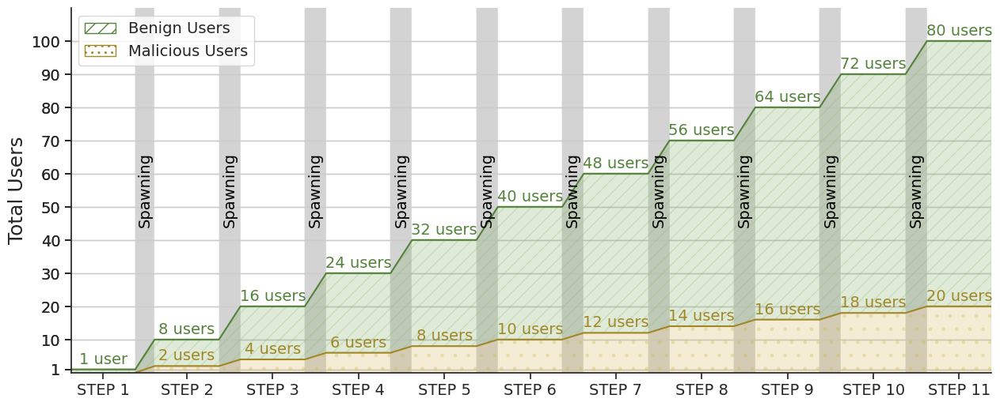

In [51]:
# Define constants

SMALL_SIZE = 10
MEDIUM_SIZE = 14
BIGGER_SIZE = 18
LINECOLOR = '#53833a'
LINECOLOR_fill = '#82B366'
LINECOLOR_ATTACK = '#a28727'
LINECOLOR_ATTACK_fill = '#D6B656'
COLORS = ["white", "lightgrey"]

# Set the plot style, color palette, and size parameters
sns.set_context("paper", font_scale = 1)
sns.set(style="ticks", palette="colorblind")

plt.rcParams.update({
    'font.size': MEDIUM_SIZE,
    'axes.titlesize': BIGGER_SIZE,
    'axes.labelsize': BIGGER_SIZE,
    'xtick.labelsize': MEDIUM_SIZE,
    'ytick.labelsize': MEDIUM_SIZE,
    'legend.fontsize': MEDIUM_SIZE,
    'figure.titlesize': BIGGER_SIZE
})


def create_plot(x, y, y_attack):
    fig, ax = plt.subplots(figsize=(15, 6))
    ax.yaxis.grid(True)
    ax.set_xticks(x)
    ax.set_yticks(y)
    ax.plot(x, y, LINECOLOR, label="Benign Users")
    ax.plot(x[1:], y_attack[1:], LINECOLOR_ATTACK, label="Malicious Users")
    ax.set_xlim(min(x), max(x))
    ax.set_ylim(0, 110)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(True)

    y0, y1 = ax.get_ylim()
    x_ticks = []
    
    for i in range(len(x)-1):
        ax.axvspan(x[i], x[i+1], color=COLORS[i%2], zorder=0)
        if i%2 == 0:
            ax.text((x[i] + x[i+1])/2, y[i]+3, f"{y[i] - y_attack[i]} user{'s' if i != 0 else ''}", {'ha': 'center', 'va': 'center'}, color=LINECOLOR)
            if i!=0:
                ax.text((x[i] + x[i+1])/2, y_attack[i]+3, f"{y_attack[i]} user{'s' if i != 0 else ''}", {'ha': 'center', 'va': 'center'}, color=LINECOLOR_ATTACK)
            x_ticks.append((x[i] + x[i+1])/2)
        else:
            ax.axvspan(x[i], x[i+1], color=COLORS[i%2], zorder=0)
            ax.text((x[i] + x[i+1])/2, y1/2, 'Spawning', {'ha': 'center', 'va': 'center'}, rotation=90, color='black')
    ax.set_xticks(x_ticks, [f"STEP {i+1}" for i in range(len(x_ticks))])
    ax.set_ylabel('Total Users')

    fill1 = ax.fill_between(x, y, y_attack, color=LINECOLOR_fill, alpha=0.25, zorder=1, hatch="//")
    fill2 = ax.fill_between(x, y_attack, color=LINECOLOR_ATTACK_fill, alpha=0.25, zorder=1, hatch=".")
    
    benign_patch = patches.Patch(label='Benign Users', hatch="//", facecolor='white', edgecolor=LINECOLOR)
    malicious_patch = patches.Patch(label='Malicious Users', hatch="..", facecolor='white', edgecolor=LINECOLOR_ATTACK)
    
    ax.legend(handles=[benign_patch, malicious_patch])
    return fig, ax

fig, ax = create_plot(x, y, y_attack)


fig.savefig('graphs/experiment_run.eps', bbox_inches='tight')
fig.savefig('graphs/experiment_run.pdf', bbox_inches='tight')
fig.savefig('graphs/experiment_run.png', dpi=100, bbox_inches='tight')
plt.show()

## Next Graph

In [6]:
df_agg.columns

Index(['throughput_mean', 'throughput_std', 'response_time_ms_count_mean',
       'response_time_ms_count_std', 'response_time_ms_mean_mean',
       'response_time_ms_mean_std', 'response_time_ms_min_mean',
       'response_time_ms_min_std', 'response_time_ms_max_mean',
       'response_time_ms_max_std', 'response_time_ms_25%_mean',
       'response_time_ms_25%_std', 'response_time_ms_50%_mean',
       'response_time_ms_50%_std', 'response_time_ms_60%_mean',
       'response_time_ms_60%_std', 'response_time_ms_70%_mean',
       'response_time_ms_70%_std', 'response_time_ms_75%_mean',
       'response_time_ms_75%_std', 'response_time_ms_80%_mean',
       'response_time_ms_80%_std', 'response_time_ms_90%_mean',
       'response_time_ms_90%_std', 'response_time_ms_95%_mean',
       'response_time_ms_95%_std', 'response_time_ms_99%_mean',
       'response_time_ms_99%_std'],
      dtype='object')

In [25]:
df_agg_depl = df_agg.loc['cluster', :, 'ks_ks'].groupby(["deployment", "scenario"], observed=True).aggregate({"throughput_mean": ["mean"], "response_time_ms_50%_mean": ["mean"], "response_time_ms_mean_mean": ["mean"], "response_time_ms_95%_mean": ["mean"]})
df_agg_depl

throughput_mean response_time_ms_50%_mean  \
                                 mean                      mean   
deployment scenario                                               
1pod       initial          50.048182                971.272727   
           scale-down       97.509091                486.436364   
           scale-up        227.801818                198.768182   
2pod       initial          37.655758                440.122727   
           scale-down       73.463333                278.259091   
           scale-up        175.815152                164.245455   
3pod       initial          27.676667                680.118182   
           scale-down       57.617576                260.618182   
           scale-up        147.427576                107.450000   
4pod       initial          17.479125               2847.419192   
           scale-down       30.331313               1523.294192   
           scale-up         76.605051                599.101010   

                      response_time_ms_mean_mean response_time_ms_95%_mean  
                                            mean                      mean  
deployment scenario                                                         
1pod       initial                    974.114057               1114.110455  
           scale-down                 489.764911                627.348182  
           scale-up                   202.936543                321.458636  
2pod       initial                   1299.819203               3313.340909  
           scale-down                 644.546883               1808.762727  
           scale-up                   265.107512                750.962273  
3pod       initial                   1765.260490               5567.337727  
           scale-down                 813.740248               2940.536364  
           scale-up                   310.779297               1161.214091  
4pod       initial                   2861.215510               3462.641919  
           scale-down                1579.242217               2045.389141  
           scale-up                   618.700064                950.421212

In [8]:
df_agg_depl.columns = ['_'.join(col) for col in df_agg_depl.columns]
df_agg_depl.groupby("deployment").aggregate({"throughput_mean_mean": ["mean"], "response_time_ms_50%_mean_mean": ["mean"], "response_time_ms_95%_mean_mean": ["mean"]})

/tmp/ipykernel_28261/3397302964.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_agg_depl.groupby("deployment").aggregate({"throughput_mean_mean": ["mean"], "response_time_ms_50%_mean_mean": ["mean"], "response_time_ms_95%_mean_mean": ["mean"]})


,throughput_mean_mean,response_time_ms_50%_mean_mean,response_time_ms_95%_mean_mean
,mean,mean,mean
deployment,,,
1pod,124.632576,552.477273,686.104205
2pod,87.782263,316.689773,2085.933598
3pod,78.299347,357.102483,3175.991932
4pod,40.766129,1703.737704,2233.360021


### Table comparison topologies

In [29]:
df_agg.loc[:, :, 'ks_ks'][["throughput_mean", "response_time_ms_50%_mean", "response_time_ms_mean_mean", "response_time_ms_95%_mean"]].groupby(["scenario", "topology"]).mean().round(0)

/tmp/ipykernel_600/4175818193.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_agg.loc[:, :, 'ks_ks'][["throughput_mean", "response_time_ms_50%_mean", "response_time_ms_mean_mean", "response_time_ms_95%_mean"]].groupby(["scenario", "topology"]).mean().round(0)


throughput_mean  response_time_ms_50%_mean  \
scenario   topology                                                     
initial    cluster                    33.0                     1235.0   
           edge-fog-cloud             33.0                     1240.0   
scale-down cluster                    65.0                      637.0   
           edge-fog-cloud             64.0                      640.0   
scale-up   cluster                   157.0                      267.0   
           edge-fog-cloud            154.0                      266.0   

                           response_time_ms_mean_mean  \
scenario   topology                                     
initial    cluster                             1725.0   
           edge-fog-cloud                      1730.0   
scale-down cluster                              882.0   
           edge-fog-cloud                       896.0   
scale-up   cluster                              349.0   
           edge-fog-cloud                       351.0   

                           response_time_ms_95%_mean  
scenario   topology                                   
initial    cluster                            3364.0  
           edge-fog-cloud                     3380.0  
scale-down cluster                            1856.0  
           edge-fog-cloud                     1845.0  
scale-up   cluster                             796.0  
           edge-fog-cloud                      817.0

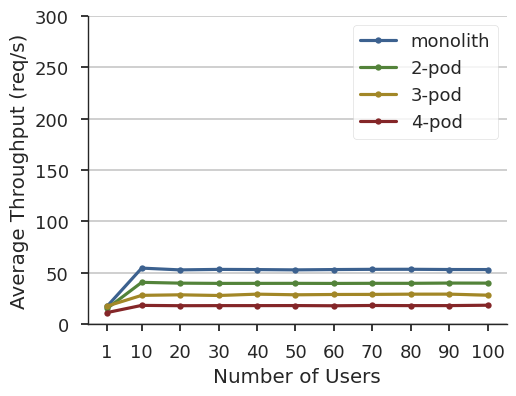

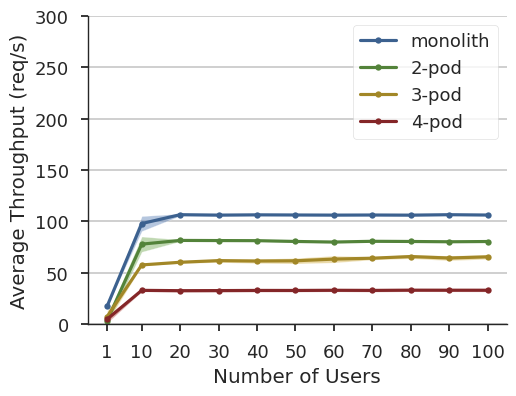

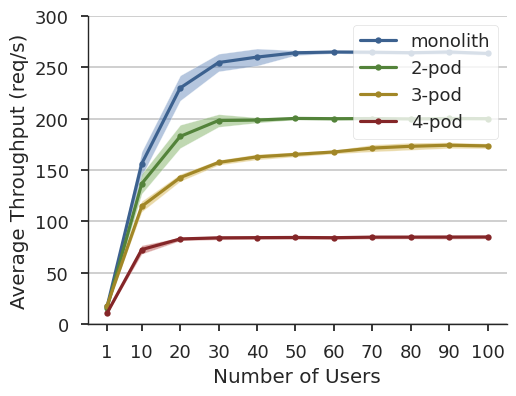

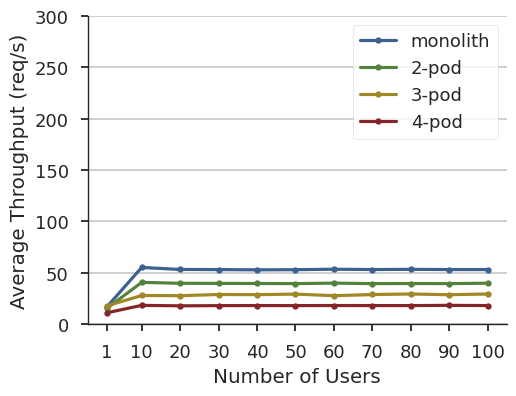

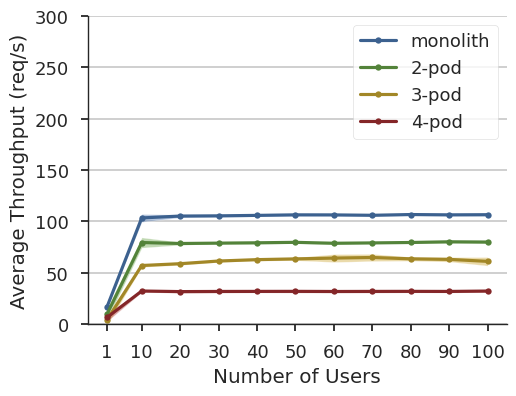

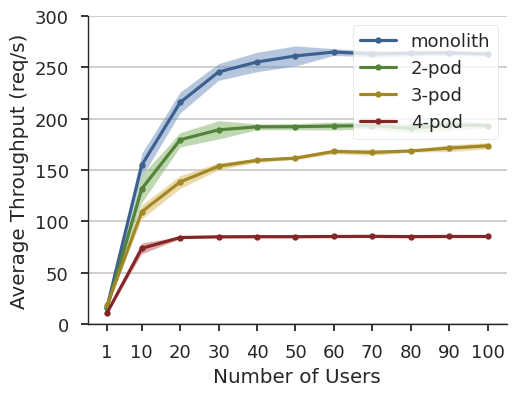

In [116]:
def label_mapper(deployment):
    if deployment == "1pod":
        return "monolith"
    if deployment == "2pod":
        return "2-pod"
    if deployment == "3pod":
        return "3-pod"
    if deployment == "4pod":
        return "4-pod"
    
edge_colors = ["#3c618f", "#53833a", "#a28727", "#842628", "#674777"]
colors = ["#6C8EBF", "#82B366", "#D6B656", "#B85450", "#9673A6"]
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=edge_colors) 

for cluster in ["cluster", "edge-fog-cloud"]:
    for scenario in ["initial", "scale-down", "scale-up"]:
        with plt.style.context(['seaborn-v0_8-talk']):
            data = df_agg.loc[cluster, :, 'ks_ks', scenario]
            fig, ax = plt.subplots(figsize=(5.4, 4))
            ax.yaxis.grid(True)
            ax.set_xticks([1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
            ax.set_yticks([0, 50, 100, 150, 200, 250, 300])
            ax.set_ylim(0, 300)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['bottom'].set_visible(True)

            for index, deployment in enumerate(['1pod', '2pod', '3pod', '4pod']):
                ax.plot(data.loc[deployment, 'throughput_mean'], '.-', label=label_mapper(deployment), color=edge_colors[index])
                ci_95 = 1.96 * data.loc[deployment, 'throughput_std'] / math.sqrt(10 if cluster == "cluster" else 8)
                ax.fill_between(data.loc[deployment].index, data.loc[deployment, 'throughput_mean'] - ci_95, data.loc[deployment, 'throughput_mean'] + ci_95, facecolor=colors[index], alpha=0.5)

            plt.xlabel('Number of Users')
            plt.ylabel('Average Throughput (req/s)')
            # plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=4)
            plt.legend(loc="upper right")
            # fig.savefig(f'graphs/{cluster}_{scenario}_throughput.pdf', bbox_inches='tight')
            # fig.savefig(f'graphs/{cluster}_{scenario}_throughput.png', dpi=300, bbox_inches='tight')
            plt.show()

In [9]:
df_agg_flow.index

MultiIndex([(       'cluster', '1pod',   'ks_ks',  'initial',   1,   'Attack'),
            (       'cluster', '1pod',   'ks_ks',  'initial',   1,   'Benign'),
            (       'cluster', '1pod',   'ks_ks',  'initial',   1, 'Zero-Day'),
            (       'cluster', '1pod',   'ks_ks',  'initial',  10,   'Attack'),
            (       'cluster', '1pod',   'ks_ks',  'initial',  10,   'Benign'),
            (       'cluster', '1pod',   'ks_ks',  'initial',  10, 'Zero-Day'),
            (       'cluster', '1pod',   'ks_ks',  'initial',  20,   'Attack'),
            (       'cluster', '1pod',   'ks_ks',  'initial',  20,   'Benign'),
            (       'cluster', '1pod',   'ks_ks',  'initial',  20, 'Zero-Day'),
            (       'cluster', '1pod',   'ks_ks',  'initial',  30,   'Attack'),
            ...
            ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up',  70, 'Zero-Day'),
            ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up',  80,   'Attack'),
            ('edge-fog-c

### Table and Graph Benign vs Malicious

In [10]:
df_agg_flow.loc[:, :, 'ks_ks', :].groupby(["deployment", "flow_type"], observed=True).aggregate({"response_time_ms_50%_mean": ["mean"]})

response_time_ms_50%_mean
                                          mean
deployment flow_type                          
1pod       Attack                   610.991042
           Benign                   550.942614
           Zero-Day                 612.747500
2pod       Attack                  1756.479583
           Benign                   272.840341
           Zero-Day                1767.681250
3pod       Attack                  1256.860625
           Benign                   308.783523
           Zero-Day                1896.531667
4pod       Attack                  1859.105324
           Benign                  1639.169207
           Zero-Day                1939.812616

In [83]:
df_agg_flow.loc[:, :, 'ks_ks', 'scale-up', 10].groupby(["flow_type", "deployment"], observed=True).aggregate({"response_time_ms_50%_mean": ["mean"]}).reindex(['4pod', '3pod', '2pod', '1pod'], level='deployment')
# .loc[:, 'response_time_ms_50%_mean']

response_time_ms_50%_mean
                                          mean
flow_type deployment                          
Attack    4pod                      139.604167
          3pod                      131.481250
          2pod                      113.200000
          1pod                       78.175000
Benign    4pod                      130.506944
          3pod                       46.437500
          2pod                       64.537500
          1pod                       61.212500
Zero-Day  4pod                      157.031250
          3pod                      156.075000
          2pod                      111.156250
          1pod                       79.262500

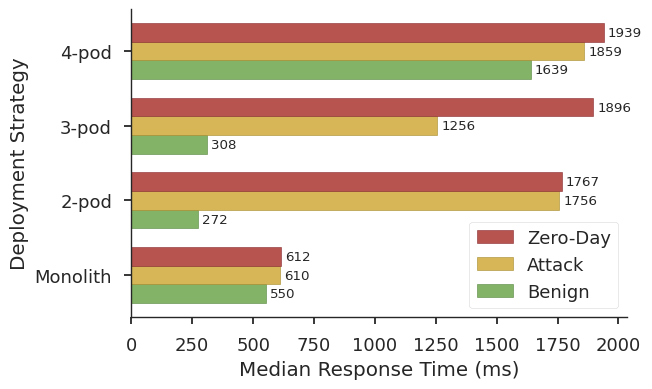

In [101]:
sns.set_theme(context='paper', style='ticks', palette='tab10')
flow_types = ["Benign", "Attack", "Zero-Day"]
with plt.style.context(['seaborn-v0_8-talk']):
    fig, ax = plt.subplots(figsize=(6.4, 4))
    prop = 'response_time_ms_50%_mean'
    x = np.arange(4)
    data = df_agg_flow.loc[:, :, 'ks_ks', :].groupby(["flow_type", "deployment"], observed=True).aggregate({prop: ["mean"]}) #.reindex(['4pod', '3pod', '2pod', '1pod'], level='deployment')
    height = 0.25
    rect = ax.barh(x, data.loc["Benign", prop]['mean'], height, label="Benign", color='#82B366', edgecolor='#53833a')
    ax.bar_label(rect, label_type='edge', padding=3, fmt='%d')
    rect = ax.barh(x + 0.25, data.loc["Attack", prop]['mean'], height, label="Attack", color='#D6B656', edgecolor='#a28727')
    ax.bar_label(rect, label_type='edge', padding=3, fmt='%d')
    rect = ax.barh(x + 0.5, data.loc["Zero-Day", prop]['mean'], height, label="Zero-Day", color='#B85450', edgecolor='#842628')
    ax.bar_label(rect, label_type='edge', padding=3, fmt='%d')
    # ax.xaxis.grid(True)
    # ax.set_xticks([1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
    # ax.set_yticks([0, 50, 100, 150, 200, 250, 300])
    # ax.set_ylim(0, 300)
    
    ax.set(yticks=x + height, yticklabels=['Monolith', '2-pod', '3-pod', '4-pod'])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(True)
    plt.xlabel('Median Response Time (ms)')
    plt.ylabel('Deployment Strategy')
    #get handles and labels
    handles, labels = plt.gca().get_legend_handles_labels()
    #specify order of items in legend
    order = [2,1,0]
    #add legend to plot
    plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])
    fig.savefig(f'graphs/flowtypes_median_response.pdf', bbox_inches='tight')
    fig.savefig(f'graphs/flowtypes_median_response.png', dpi=300, bbox_inches='tight')
    plt.show()

### Graph sorting for orchestration

In [13]:
sns.set_theme(context='paper', style='ticks', palette='tab10')
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=["#6C8EBF", "#82B366", "#D6B656", "#B85450"]) 


In [63]:
df_merged = pd.read_parquet('./dataframe_graphs/v2/merged_ids_slim.parquet')
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32012382 entries, 0 to 32012381
Data columns (total 8 columns):
 #   Column            Dtype   
---  ------            -----   
 0   topology          object  
 1   deployment        object  
 2   sorting           object  
 3   scenario          object  
 4   num_repetition    object  
 5   flow_type         category
 6   num_of_users      int64   
 7   response_time_ms  int64   
dtypes: category(1), int64(2), object(5)
memory usage: 1.7+ GB


In [36]:
def set_box_color(bp, color, facecolor):
    plt.setp(bp['boxes'], color=color, facecolor=facecolor)
    plt.setp(bp['whiskers'], color=color)
    plt.setp(bp['caps'], color=color)
    plt.setp(bp['medians'], color=color)
    plt.setp(bp['fliers'], color=color)

def box_plot(data, sorting, deployment, widths, positions, labels, colors, facecolors):
    bp = plt.boxplot(data.loc[(data['sorting'] == sorting) & (data['deployment'] == deployment),'response_time_ms'], vert=False, positions=positions, widths=widths, patch_artist=True, labels=labels, showfliers=False)
    set_box_color(bp, colors, facecolors)
    return bp

In [70]:
(df_merged[(df_merged['topology'] == 'cluster') & (df_merged['scenario'] == 'scale-up')]
    .groupby(['deployment', 'sorting'])['response_time_ms']
    .quantile([0.25, 0.5, 0.75])
    .unstack()
    .rename(columns={0.25:'Q1', 0.5:'M', 0.75:'Q3'}))

Q1      M      Q3
deployment sorting                                    
1pod       ks_ks                  118.0  211.0   311.0
2pod       diktyo_cycle            97.0  191.0   446.0
           diktyo_kahn             84.0  162.0   362.0
           diktyo_reverse-kahn     85.0  166.0   370.0
           ks_ks                   80.0  158.0   353.0
3pod       diktyo_alternate-kahn   52.0  115.0   391.0
           diktyo_cycle            65.0  133.0   466.0
           diktyo_kahn             52.0  116.0   389.0
           diktyo_priority         52.0  115.0   396.0
           diktyo_qos              51.0  115.0   389.0
           diktyo_reverse-kahn     52.0  115.0   391.0
           ks_ks                   52.0  115.0   400.0
           qos_qos                 51.0  113.0   397.0
4pod       diktyo_alternate-kahn  298.0  582.0   925.0
           diktyo_cycle           319.0  619.0   950.0
           diktyo_kahn            297.0  580.0   921.0
           diktyo_priority        338.0  669.0  1032.0
           diktyo_qos             334.0  656.0  1034.0
           diktyo_reverse-kahn    284.0  566.0   927.0
           ks_ks                  316.0  628.0   955.0
           qos_qos                378.0  692.0  1079.0

In [38]:
edge_colors = ["#3c618f", "#53833a", "#a28727", "#842628", "#674777"]
colors = ["#6C8EBF", "#82B366", "#D6B656", "#B85450", "#9673A6"]

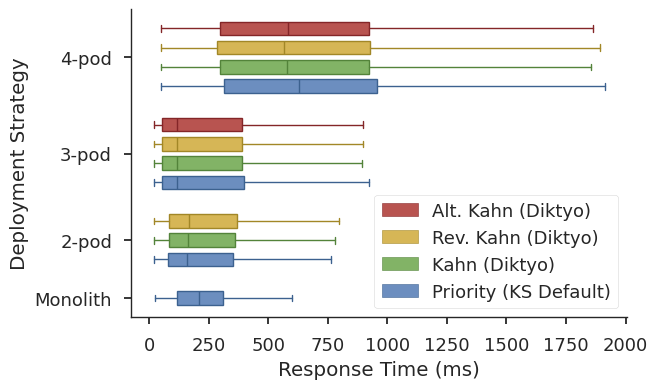

In [102]:
df_filtered = df_merged[(df_merged['topology'] == 'cluster') & (df_merged['scenario'] == 'scale-up')]

with plt.style.context(['seaborn-v0_8-talk']):
    fig, ax = plt.subplots(figsize=(6.4, 4))
    # 1pod
    box_plot(df_filtered, 'ks_ks', '1pod', [0.7], [1], ['Default'], edge_colors[0], colors[0])

    #2pod
    box_plot(df_filtered, 'ks_ks', '2pod', [0.7], [3], ['Default'], edge_colors[0], colors[0])
    box_plot(df_filtered, 'diktyo_kahn', '2pod', [0.7], [4], ['Kahn'], edge_colors[1], colors[1])
    box_plot(df_filtered, 'diktyo_reverse-kahn', '2pod', [0.7], [5], ['Rev. Kahn'], edge_colors[2], colors[2])

    #3pod
    box_plot(df_filtered, 'ks_ks', '3pod', [0.7], [7], ['Default'], edge_colors[0], colors[0])
    box_plot(df_filtered, 'diktyo_kahn', '3pod', [0.7], [8], ['Kahn'], edge_colors[1], colors[1])
    box_plot(df_filtered, 'diktyo_reverse-kahn', '3pod', [0.7], [9], ['Rev. Kahn'], edge_colors[2], colors[2])
    box_plot(df_filtered, 'diktyo_alternate-kahn', '3pod', [0.7], [10], ['Alt. Kahn'], edge_colors[3], colors[3])
    # box_plot(df_filtered, 'diktyo_cycle', '3pod', [0.7], [11], ['Cycle'], edge_colors[4], colors[4])

    #4pod
    box_plot(df_filtered, 'ks_ks', '4pod', [0.7], [12], ['Default'], edge_colors[0], colors[0])
    box_plot(df_filtered, 'diktyo_kahn', '4pod', [0.7], [13], ['Kahn'], edge_colors[1], colors[1])
    box_plot(df_filtered, 'diktyo_reverse-kahn', '4pod', [0.7], [14], ['Rev. Kahn'], edge_colors[2], colors[2])
    box_plot(df_filtered, 'diktyo_alternate-kahn', '4pod', [0.7], [15], ['Alt. Kahn'], edge_colors[3], colors[3])
    # box_plot(df_filtered, 'diktyo_cycle', '4pod', [0.7], [17], ['Cycle'], edge_colors[4], colors[4])

    plt.yticks([1, 4, 8.5, 13.5], ['Monolith', '2-pod', '3-pod', '4-pod'])
    plt.ylim((0, 16))

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(True)
    plt.xlabel('Response Time (ms)')
    plt.ylabel('Deployment Strategy')
    
    ks_patch = patches.Patch(label='Priority (KS Default)', facecolor=colors[0], edgecolor=edge_colors[0])
    kahn_patch = patches.Patch(label='Kahn (Diktyo)', facecolor=colors[1], edgecolor=edge_colors[1])
    rev_kahn_patch = patches.Patch(label='Rev. Kahn (Diktyo)', facecolor=colors[2], edgecolor=edge_colors[2])
    alt_kahn_patch = patches.Patch(label='Alt. Kahn (Diktyo)', facecolor=colors[3], edgecolor=edge_colors[3])
    # cycle_patch = patches.Patch(label='Cycle (Diktyo)', facecolor=colors[4], edgecolor=edge_colors[4])
    
    ax.legend(handles=[alt_kahn_patch, rev_kahn_patch, kahn_patch, ks_patch])
    fig.savefig(f'graphs/sorting-box.pdf', bbox_inches='tight')
    fig.savefig(f'graphs/sorting-box.png', dpi=300, bbox_inches='tight')
    plt.show()

## Resource plot

In [39]:
df_resource_agg.index

MultiIndex([(       'cluster', '1pod',   'ks_ks',  'initial',   1, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',   1, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  10, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  10, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  20, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  20, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  30, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  30, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  40, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  40, ...),
            ...
            ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up',  90, ...),
            ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up',  90, ...),
            ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up',  90, ...),
            ('edge-fog-cloud', '4po

In [42]:
df_resource.columns

Index(['topology', 'deployment', 'sorting', 'scenario', 'repetition',
       'num_users', 'container', 'cpu_unit', 'cpu_avg', 'cpu_min', 'cpu_max',
       'cpu_stddev', 'cpu_count', 'mem_unit', 'mem_avg', 'mem_min', 'mem_max',
       'mem_stddev', 'mem_count', 'traffic_received_unit',
       'traffic_received_avg', 'traffic_received_min', 'traffic_received_max',
       'traffic_received_stddev', 'traffic_received_count',
       'traffic_transmitted_unit', 'traffic_transmitted_avg',
       'traffic_transmitted_min', 'traffic_transmitted_max',
       'traffic_transmitted_stddev', 'traffic_transmitted_count'],
      dtype='object')

In [36]:
df_resource_agg.reset_index()['container'].unique()

['allinoneapi', 'flowgenerator', 'multiclasszerodayapi', 'preprocessingallbinary', 'preprocessingbinaryapi', 'preprocessingmulticlassapi', 'zerodayapi', 'binaryapi', 'multiclassapi', 'preprocessingapi']
Categories (10, object): ['allinoneapi', 'binaryapi', 'flowgenerator', 'multiclassapi', ..., 'preprocessingapi', 'preprocessingbinaryapi', 'preprocessingmulticlassapi', 'zerodayapi']

In [67]:
# Set display options to show all columns
pd.set_option('display.max_columns', None)
df_resource.query("topology == 'cluster' & deployment == '4pod' & sorting == 'ks_ks' & scenario == 'scale-up' & num_users == 30 & container == 'binaryapi'")# [['repetition', 'cpu_avg', 'mem_avg']]

,topology,deployment,sorting,scenario,repetition,num_users,container,cpu_unit,cpu_avg,cpu_min,cpu_max,cpu_stddev,cpu_count,mem_unit,mem_avg,mem_min,mem_max,mem_stddev,mem_count,traffic_received_unit,traffic_received_avg,traffic_received_min,traffic_received_max,traffic_received_stddev,traffic_received_count,traffic_transmitted_unit,traffic_transmitted_avg,traffic_transmitted_min,traffic_transmitted_max,traffic_transmitted_stddev,traffic_transmitted_count
15690,cluster,4pod,ks_ks,scale-up,3,30,binaryapi,mCPU,127.243632,93.296152,180.344677,37.104078,5,MiB,97.748802,90.668646,122.573414,12.435913,5,KBit/s,75.347990,75.347990,75.347990,0.0,1,KBit/s,38.975403,38.975403,38.975403,0.0,1
15745,cluster,4pod,ks_ks,scale-up,8,30,binaryapi,mCPU,119.769397,80.354409,168.416885,35.769231,5,MiB,100.679709,91.759709,132.710605,16.031965,5,KBit/s,61.763093,61.763093,61.763093,0.0,1,KBit/s,30.263767,30.263767,30.263767,0.0,1
15804,cluster,4pod,ks_ks,scale-up,6,30,binaryapi,mCPU,91.878143,23.202970,166.098454,46.126701,5,MiB,96.029284,80.362701,133.500066,19.365212,5,KBit/s,74.625797,74.625797,74.625797,0.0,1,KBit/s,38.424139,38.424139,38.424139,0.0,1
15855,cluster,4pod,ks_ks,scale-up,4,30,binaryapi,mCPU,121.357194,85.112505,178.862801,36.045786,5,MiB,95.830551,90.736026,112.587435,8.425943,5,KBit/s,69.173008,69.173008,69.173008,0.0,1,KBit/s,33.977013,33.977013,33.977013,0.0,1
15911,cluster,4pod,ks_ks,scale-up,10,30,binaryapi,mCPU,110.941926,86.403728,167.071088,29.274624,5,MiB,97.832026,91.334979,117.037154,9.647109,5,KBit/s,66.750899,66.750899,66.750899,0.0,1,KBit/s,34.531017,34.531017,34.531017,0.0,1
15966,cluster,4pod,ks_ks,scale-up,5,30,binaryapi,mCPU,148.440722,96.776335,210.579789,43.642271,5,MiB,96.821328,91.266877,113.657964,8.491081,5,KBit/s,73.447933,73.447933,73.447933,0.0,1,KBit/s,37.080410,37.080410,37.080410,0.0,1
16022,cluster,4pod,ks_ks,scale-up,9,30,binaryapi,mCPU,128.663413,95.939076,175.067554,37.779613,5,MiB,97.930141,93.352550,114.341595,8.213941,5,KBit/s,71.608590,71.608590,71.608590,0.0,1,KBit/s,37.875750,37.875750,37.875750,0.0,1
16079,cluster,4pod,ks_ks,scale-up,7,30,binaryapi,mCPU,109.542656,58.616746,191.590143,46.000496,5,MiB,91.371941,82.404966,109.820782,9.955879,5,KBit/s,24.844534,24.844534,24.844534,0.0,1,KBit/s,12.587057,12.587057,12.587057,0.0,1
16131,cluster,4pod,ks_ks,scale-up,2,30,binaryapi,mCPU,176.872851,105.807511,224.012980,38.930868,5,MiB,98.942709,91.865088,118.727241,10.349303,5,KBit/s,71.918733,71.918733,71.918733,0.0,1,KBit/s,37.763350,37.763350,37.763350,0.0,1


In [69]:
df_resource_agg.index

MultiIndex([(       'cluster', '1pod',   'ks_ks',  'initial',   1, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',   1, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  10, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  10, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  20, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  20, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  30, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  30, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  40, ...),
            (       'cluster', '1pod',   'ks_ks',  'initial',  40, ...),
            ...
            ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up',  90, ...),
            ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up',  90, ...),
            ('edge-fog-cloud', '4pod', 'qos_qos', 'scale-up',  90, ...),
            ('edge-fog-cloud', '4po

In [81]:
df_resource_agg.loc['cluster', '1pod', 'ks_ks', 'scale-up', :, :][['cpu_avg_mean', 'cpu_avg_std', 'mem_avg_mean', 'mem_avg_std']]

cpu_avg_mean  cpu_avg_std  mem_avg_mean  mem_avg_std
num_users container                                                          
1         allinoneapi      757.960806   470.366717    152.071961     1.991435
          flowgenerator           NaN          NaN           NaN          NaN
10        allinoneapi     1196.849084   244.941758    156.882563     0.174500
          flowgenerator           NaN          NaN           NaN          NaN
20        allinoneapi     1521.803702   546.149518    154.413927     5.744502
          flowgenerator           NaN          NaN           NaN          NaN
30        allinoneapi     1752.243697   400.197659    157.015986     0.260951
          flowgenerator           NaN          NaN           NaN          NaN
40        allinoneapi     1909.519270   161.848735    157.110477     0.132765
          flowgenerator           NaN          NaN           NaN          NaN
50        allinoneapi     1961.556883    85.250045    157.155536     0.098484
          flowgenerator           NaN          NaN           NaN          NaN
60        allinoneapi     1966.045136    80.874443    157.189869     0.086981
          flowgenerator           NaN          NaN           NaN          NaN
70        allinoneapi     1977.797855    56.389901    157.213477     0.075755
          flowgenerator           NaN          NaN           NaN          NaN
80        allinoneapi     1830.734998    93.725449    157.227515     0.069178
          flowgenerator           NaN          NaN           NaN          NaN
90        allinoneapi     1989.508931    16.418335    157.303694     0.093194
          flowgenerator           NaN          NaN           NaN          NaN
100       allinoneapi     1935.097413   166.554747    157.308245     0.100463
          flowgenerator           NaN          NaN           NaN          NaN

In [74]:
(df_resource[(df_resource.topology == 'cluster') & (df_resource.deployment == '1pod') & (df_resource.sorting == 'ks_ks') & (df_resource.scenario == 'scale-up')]
    .groupby(['deployment', 'scenario', 'num_users', 'container'], observed=True)
    .aggregate({'cpu_avg': ['mean', 'std', 'count'], 'mem_avg': ['mean', 'std', 'count']}))

cpu_avg                    \
                                                    mean         std count   
deployment scenario num_users container                                      
1pod       scale-up 1         allinoneapi     757.960806  470.366717    10   
                              flowgenerator          NaN         NaN     0   
                    10        allinoneapi    1196.849084  244.941758    10   
                              flowgenerator          NaN         NaN     0   
                    20        allinoneapi    1521.803702  546.149518    10   
                              flowgenerator          NaN         NaN     0   
                    30        allinoneapi    1752.243697  400.197659    10   
                              flowgenerator          NaN         NaN     0   
                    40        allinoneapi    1909.519270  161.848735    10   
                              flowgenerator          NaN         NaN     0   
                    50        allinoneapi    1961.556883   85.250045    10   
                              flowgenerator          NaN         NaN     0   
                    60        allinoneapi    1966.045136   80.874443    10   
                              flowgenerator          NaN         NaN     0   
                    70        allinoneapi    1977.797855   56.389901    10   
                              flowgenerator          NaN         NaN     0   
                    80        allinoneapi    1830.734998   93.725449    10   
                              flowgenerator          NaN         NaN     0   
                    90        allinoneapi    1989.508931   16.418335    10   
                              flowgenerator          NaN         NaN     0   
                    100       allinoneapi    1935.097413  166.554747    10   
                              flowgenerator          NaN         NaN     0   

                                                mem_avg                  
                                                   mean       std count  
deployment scenario num_users container                                  
1pod       scale-up 1         allinoneapi    152.071961  1.991435    10  
                              flowgenerator         NaN       NaN     0  
                    10        allinoneapi    156.882563  0.174500    10  
                              flowgenerator         NaN       NaN     0  
                    20        allinoneapi    154.413927  5.744502    10  
                              flowgenerator         NaN       NaN     0  
                    30        allinoneapi    157.015986  0.260951    10  
                              flowgenerator         NaN       NaN     0  
                    40        allinoneapi    157.110477  0.132765    10  
                              flowgenerator         NaN       NaN     0  
                    50        allinoneapi    157.155536  0.098484    10  
                              flowgenerator         NaN       NaN     0  
                    60        allinoneapi    157.189869  0.086981    10  
                              flowgenerator         NaN       NaN     0  
                    70        allinoneapi    157.213477  0.075755    10  
                              flowgenerator         NaN       NaN     0  
                    80        allinoneapi    157.227515  0.069178    10  
                              flowgenerator         NaN       NaN     0  
                    90        allinoneapi    157.303694  0.093194    10  
                              flowgenerator         NaN       NaN     0  
                    100       allinoneapi    157.308245  0.100463    10  
                              flowgenerator         NaN       NaN     0

In [101]:
df_resource_agg.loc['cluster', :, 'ks_ks', 'scale-up'].loc['1pod', :, 'allinoneapi'][['cpu_avg_mean', 'cpu_avg_std', 'mem_avg_mean', 'mem_avg_std']]
# .groupby(["container", "num_users"], observed=True).aggregate({"cpu_avg_mean": ["mean", "count"], "mem_avg_mean": ["mean"]})
# .aggregate({"response_time_ms_50%_mean": ["mean"]}).reindex(['4pod', '3pod', '2pod', '1pod'], level='deployment')


,cpu_avg_mean,cpu_avg_std,mem_avg_mean,mem_avg_std
num_users,,,,
1,757.960806,470.366717,152.071961,1.991435
10,1196.849084,244.941758,156.882563,0.174500
20,1521.803702,546.149518,154.413927,5.744502
30,1752.243697,400.197659,157.015986,0.260951
40,1909.519270,161.848735,157.110477,0.132765
50,1961.556883,85.250045,157.155536,0.098484
60,1966.045136,80.874443,157.189869,0.086981
70,1977.797855,56.389901,157.213477,0.075755
80,1830.734998,93.725449,157.227515,0.069178


### Table for resource usage

In [84]:
df_res = df_resource_agg.query('container != "flowgenerator"').loc['cluster', :, 'ks_ks', :].groupby(["deployment", "container", "scenario"], observed=True)[["mem_avg_mean", "cpu_avg_mean", "traffic_received_avg_mean", "traffic_transmitted_avg_mean"]].mean()
df_res.unstack()

mem_avg_mean                          \
scenario                                   initial  scale-down    scale-up   
deployment container                                                         
1pod       allinoneapi                  156.820538  157.854153  156.444841   
2pod       multiclasszerodayapi          86.437067   88.155955   85.602642   
           preprocessingallbinary       278.815909  337.913265  247.819332   
3pod       preprocessingbinaryapi       150.107903  180.504932  128.182634   
           preprocessingmulticlassapi   127.200716  160.383065  122.132878   
           zerodayapi                    35.169270   40.278540   35.866739   
4pod       binaryapi                    103.634043  109.669960   97.218807   
           multiclassapi                101.440846  104.531899   93.913868   
           preprocessingapi             159.637799  212.395289  141.505426   
           zerodayapi                    33.236779   35.122139   33.012407   

                                      cpu_avg_mean                            \
scenario                                   initial   scale-down     scale-up   
deployment container                                                           
1pod       allinoneapi                 1826.861787  1793.640696  1709.010707   
2pod       multiclasszerodayapi         190.753062   187.808239   165.001024   
           preprocessingallbinary      1266.266666  1255.807990  1208.219682   
3pod       preprocessingbinaryapi       693.823753   737.518741   764.345594   
           preprocessingmulticlassapi   401.578832   472.127192   468.970125   
           zerodayapi                    19.378768    21.338923    17.436405   
4pod       binaryapi                    145.416984   125.866186   118.090620   
           multiclassapi                163.580677   133.810009   111.520514   
           preprocessingapi             826.446599   808.205244   805.672262   
           zerodayapi                    15.686514    11.856025    10.043160   

                                      traffic_received_avg_mean             \
scenario                                                initial scale-down   
deployment container                                                         
1pod       allinoneapi                                42.862958  41.359625   
2pod       multiclasszerodayapi                       30.706737  30.899610   
           preprocessingallbinary                     49.087312  49.583717   
3pod       preprocessingbinaryapi                     37.524292  39.646511   
           preprocessingmulticlassapi                 26.346074  28.605739   
           zerodayapi                                  9.902947  10.797787   
4pod       binaryapi                                  70.234989  60.702191   
           multiclassapi                              24.879595  21.961042   
           preprocessingapi                           35.227099  31.193922   
           zerodayapi                                  6.822914   5.852429   

                                                 traffic_transmitted_avg_mean  \
scenario                                scale-up                      initial   
deployment container                                                            
1pod       allinoneapi                 39.782151                    26.410097   
2pod       multiclasszerodayapi        30.635336                    12.504444   
           preprocessingallbinary      47.439446                    54.251532   
3pod       preprocessingbinaryapi      41.115317                    34.999545   
           preprocessingmulticlassapi  27.878145                    22.238541   
           zerodayapi                  10.982926                     8.631546   
4pod       binaryapi                   62.735824                    35.371992   
           multiclassapi               22.137478                    15.908578   
           preprocessingapi            31.845398                    72.77179

In [85]:
df_res.groupby(["deployment", "scenario"]).sum().unstack()

/tmp/ipykernel_600/2773112925.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_res.groupby(["deployment", "scenario"]).sum().unstack()


mem_avg_mean                         cpu_avg_mean               \
scenario        initial  scale-down    scale-up      initial   scale-down   
deployment                                                                  
1pod         156.820538  157.854153  156.444841  1826.861787  1793.640696   
2pod         365.252977  426.069220  333.421974  1457.019728  1443.616228   
3pod         312.477889  381.166537  286.182251  1114.781353  1230.984856   
4pod         397.949467  461.719287  365.650508  1151.130775  1079.737463   

                        traffic_received_avg_mean                          \
scenario       scale-up                   initial  scale-down    scale-up   
deployment                                                                  
1pod        1709.010707                 42.862958   41.359625   39.782151   
2pod        1373.220706                 79.794049   80.483327   78.074782   
3pod        1250.752123                 73.773313   79.050036   79.976388   
4pod        1045.326557                137.164597  119.709584  122.723153   

           traffic_transmitted_avg_mean                          
scenario                        initial  scale-down    scale-up  
deployment                                                       
1pod                          26.410097   25.550084   24.469938  
2pod                          66.755975   67.816703   65.901775  
3pod                          65.869632   70.140452   71.581544  
4pod                         129.942242  114.383165  117.343073

In [86]:
df_table = df_resource_agg.loc['cluster', :, 'ks_ks', :].groupby(["deployment", "container", "scenario"], observed=True).aggregate({"cpu_avg_mean": ["mean", "std"], "mem_avg_mean": ["mean", "std"]})
# df_table.loc[:, ('mem_avg_mean', 'ci95')] = 1.96 * df_table['mem_avg_mean']['std'] / math.sqrt(10) # Does not make sense to compute CI over different users
df_table

cpu_avg_mean              \
                                                         mean         std   
deployment container                  scenario                              
1pod       allinoneapi                initial     1826.861787  428.158057   
                                      scale-down  1793.640696  296.692925   
                                      scale-up    1709.010707  398.826872   
           flowgenerator              initial             NaN         NaN   
                                      scale-down          NaN         NaN   
                                      scale-up            NaN         NaN   
2pod       flowgenerator              initial             NaN         NaN   
                                      scale-down          NaN         NaN   
                                      scale-up            NaN         NaN   
           multiclasszerodayapi       initial      190.753062   32.639646   
                                      scale-down   187.808239   31.787290   
                                      scale-up     165.001024   28.564772   
           preprocessingallbinary     initial     1266.266666  291.998277   
                                      scale-down  1255.807990  180.098399   
                                      scale-up    1208.219682  271.463338   
3pod       flowgenerator              initial             NaN         NaN   
                                      scale-down          NaN         NaN   
                                      scale-up            NaN         NaN   
           preprocessingbinaryapi     initial      693.823753  101.321047   
                                      scale-down   737.518741  127.075514   
                                      scale-up     764.345594  190.760615   
           preprocessingmulticlassapi initial      401.578832   61.698214   
                                      scale-down   472.127192   71.691035   
                                      scale-up     468.970125  101.062666   
           zerodayapi                 initial       19.378768    1.474474   
                                      scale-down    21.338923    4.433796   
                                      scale-up      17.436405    0.835576   
4pod       binaryapi                  initial      145.416984   10.514964   
                                      scale-down   125.866186   26.224674   
                                      scale-up     118.090620   16.457958   
           flowgenerator              initial             NaN         NaN   
                                      scale-down          NaN         NaN   
                                      scale-up            NaN         NaN   
           multiclassapi              initial      163.580677   19.069042   
                                      scale-down   133.810009   24.363197   
                                      scale-up     111.520514   12.012445   
           preprocessingapi           initial      826.446599  155.827920   
                                      scale-down   808.205244  133.677008   
                                      scale-up     805.672262  156.290835   
           zerodayapi                 initial       15.686514    1.592688   
                                      scale-down    11.856025    2.045822   
                                      scale-up      10.043160    1.323482   

                                                 mem_avg_mean             
                                                         mean        std  
deployment container                  scenario                            
1pod       allinoneapi                initial      156.820538   1.114893  
                                      scale-down   157.854153   0.330410  
                                      scale-up     156.444841   1.671951  
           flowgenerator              initial             NaN        NaN  
                                      scale-down          

In [87]:
df_resource_agg.head()

cpu_count_mean  \
topology deployment sorting scenario num_users container                       
cluster  1pod       ks_ks   initial  1         allinoneapi               1.0   
                                               flowgenerator             0.0   
                                     10        allinoneapi               0.8   
                                               flowgenerator             0.0   
                                     20        allinoneapi               1.0   

                                                              cpu_count_std  \
topology deployment sorting scenario num_users container                      
cluster  1pod       ks_ks   initial  1         allinoneapi         0.000000   
                                               flowgenerator       0.000000   
                                     10        allinoneapi         0.421637   
                                               flowgenerator       0.000000   
                                     20        allinoneapi         0.000000   

                                                              cpu_avg_mean  \
topology deployment sorting scenario num_users container                     
cluster  1pod       ks_ks   initial  1         allinoneapi      570.433185   
                                               flowgenerator           NaN   
                                     10        allinoneapi     1993.245252   
                                               flowgenerator           NaN   
                                     20        allinoneapi     1668.876335   

                                                              cpu_avg_std  \
topology deployment sorting scenario num_users container                    
cluster  1pod       ks_ks   initial  1         allinoneapi     340.402284   
                                               flowgenerator          NaN   
                                     10        allinoneapi      18.857243   
                                               flowgenerator          NaN   
                                     20        allinoneapi     681.565971   

                                                              cpu_min_mean  \
topology deployment sorting scenario num_users container                     
cluster  1pod       ks_ks   initial  1         allinoneapi      570.433185   
                                               flowgenerator           NaN   
                                     10        allinoneapi     1993.245252   
                                               flowgenerator           NaN   
                                     20        allinoneapi     1668.876335   

                                                              cpu_min_std  \
topology deployment sorting scenario num_users container                    
cluster  1pod       ks_ks   initial  1         allinoneapi     340.402284   
                                               flowgenerator          NaN   
                                     10        allinoneapi      18.857243   
                                               flowgenerator          NaN   
                                     20        allinoneapi     681.565971   

                                                              cpu_max_mean  \
topology deployment sorting scenario num_users container                     
cluster  1pod       ks_ks   initial  1         allinoneapi      570.433185   
                                               flowgenerator           NaN   
                                     10        allinoneapi     1993.245252   
                                               flowgenerator           NaN   
                                     20        allinoneapi     1668.876335   

                                                              cpu_max_std  \
topology deployment sorting scenario num_users container                    
cluster  1pod       ks_ks   initial  1         allinoneapi     340.40228

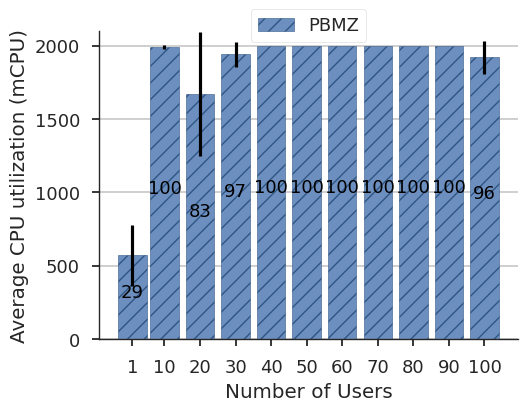

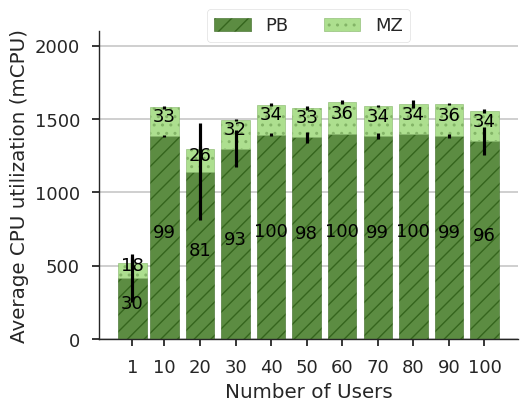

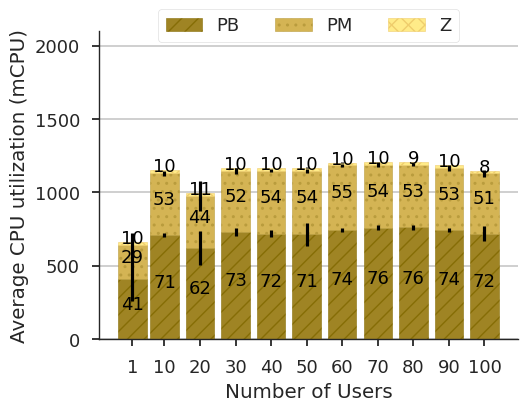

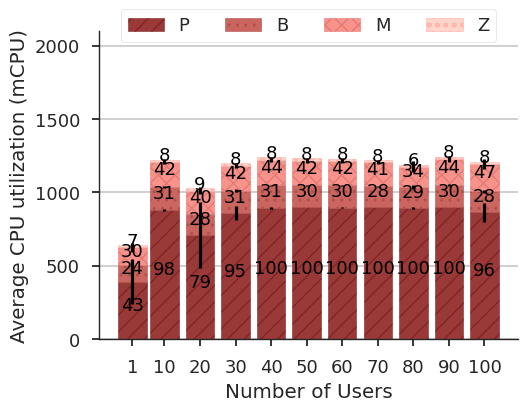

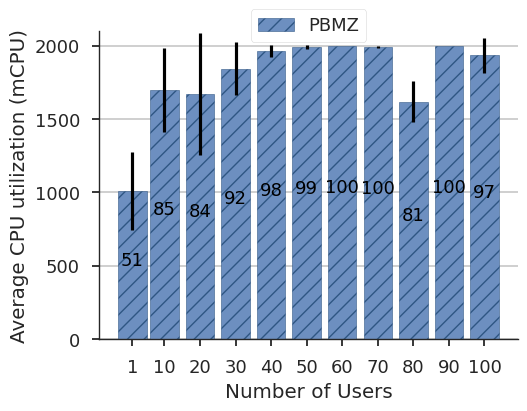

...

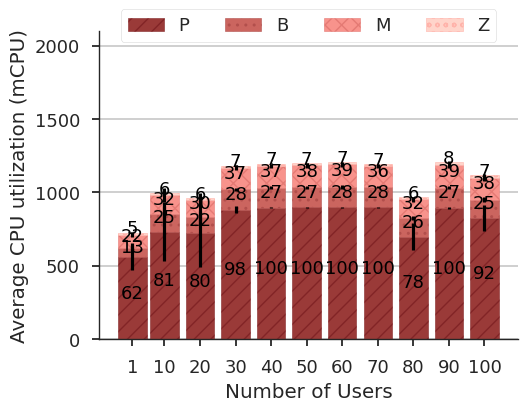

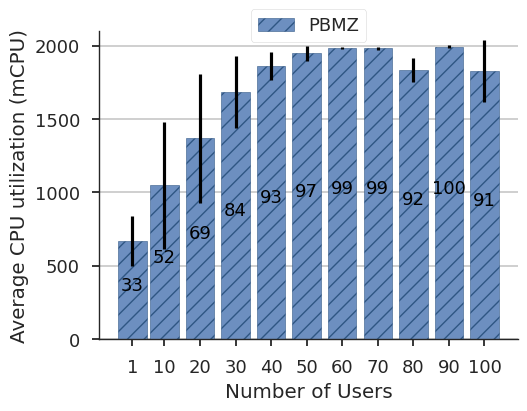

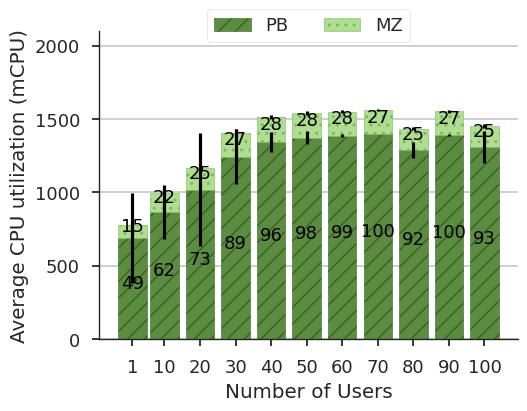

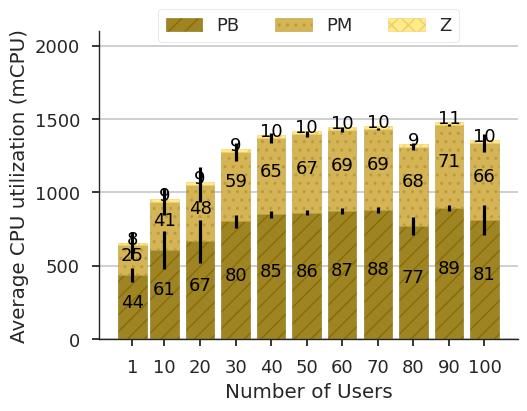

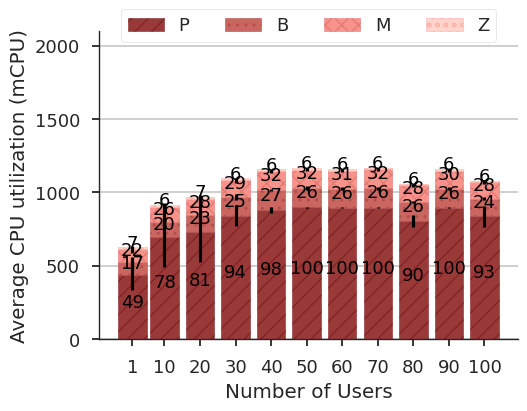

In [108]:
def label_mapper(deployment):
    if deployment == "1pod":
        return "monolith"
    if deployment == "2pod":
        return "2-pod"
    if deployment == "3pod":
        return "3-pod"
    if deployment == "4pod":
        return "4-pod"
    
def deployment_to_containers(deployment):
    if deployment == '1pod':
        return ['allinoneapi']
    if deployment == '2pod':
        return ['preprocessingallbinary', 'multiclasszerodayapi']
    if deployment == '3pod':
        return ['preprocessingbinaryapi', 'preprocessingmulticlassapi', 'zerodayapi']
    if deployment == '4pod':
        return ['preprocessingapi', 'binaryapi', 'multiclassapi', 'zerodayapi']
    
# red: https://www.vis4.net/palettes/#/10|s|b85450|ffffe0,ff005e,93003a|1|1 -> 10 colors, alternating color and edge color (starting from right), input original color
# yellow: https://www.vis4.net/palettes/#/10|s|d6b656|ffffe0,ff005e,93003a|1|1
# green: https://www.vis4.net/palettes/#/6|s|82b366|ffffe0,ff005e,93003a|1|1
def deployment_to_color(deployment):
    if deployment == '1pod':
        return ['#6d8fc0']
    if deployment == '2pod':
        return ['#5c8c42', '#addf8f']
    if deployment == '3pod':
        return ['#9f8424', '#d4b454', '#ffeb88']
    if deployment == '4pod':
        return ['#9a3a38', '#cb655f', '#f8938c', '#ffd4ca']
    
def deployment_to_edgecolor(deployment):
    if deployment == '1pod':
        return ['#2f5683']
    if deployment == '2pod':
        return ['#35651d', '#83b467']
    if deployment == '3pod':
        return ['#866d06', '#b99c3d', '#efcd6c']
    if deployment == '4pod':
        return ['#822426', '#b24f4c', '#e47a74', '#ffb3aa']
    
def container_to_label(container):
    container_labels = {
        'allinoneapi': 'PBMZ',
        'preprocessingallbinary': 'PB',
        'multiclasszerodayapi': 'MZ',
        'preprocessingbinaryapi': 'PB',
        'preprocessingmulticlassapi': 'PM',
        'zerodayapi': 'Z',
        'preprocessingapi': 'P',
        'binaryapi': 'B',
        'multiclassapi': 'M'
    }
    return container_labels.get(container)

def container_to_cpulim(container):
    container_labels = {
        'allinoneapi': 2000,
        'preprocessingallbinary': 1400,
        'multiclasszerodayapi': 600,
        'preprocessingbinaryapi': 1000,
        'preprocessingmulticlassapi': 800,
        'zerodayapi': 200,
        'preprocessingapi': 900,
        'binaryapi': 500,
        'multiclassapi': 400
    }
    return container_labels.get(container)
    
edge_colors = ["#3c618f", "#53833a", "#a28727", "#842628", "#674777"]
colors = ["#6C8EBF", "#82B366", "#D6B656", "#B85450", "#9673A6"]
hatches = ['//', '..', 'xx', 'oo']
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=edge_colors) 

for topology in ["cluster", "edge-fog-cloud"]:
    for scenario in ["initial", "scale-down", "scale-up"]:
        with plt.style.context(['seaborn-v0_8-talk']):
            data = df_resource_agg.loc[topology, :, 'ks_ks', scenario]

            for index, deployment in enumerate(['1pod', '2pod', '3pod', '4pod']):
                fig, ax = plt.subplots(figsize=(5.4, 4))
                ax.yaxis.grid(True)
                ax.set_xticks([1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
                # ax.set_yticks([0, 250, 500, 750, 1000, 1250, 1500, 1750, 2000])
                ax.set_ylim(0, 2100)
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.spines['bottom'].set_visible(True)
                bottom = np.zeros(11)
                for index, container in enumerate(deployment_to_containers(deployment)):
                    ci_95 = 1.96 * data.loc[deployment, :, container]['cpu_avg_std'] / math.sqrt(10 if topology == "cluster" else 8)
                    bars = ax.bar(data.loc[deployment, :, container].index, data.loc[deployment, :, container]['cpu_avg_mean'], width=8, 
                                  bottom=bottom, yerr=ci_95, label=container_to_label(container), color=deployment_to_color(deployment)[index], 
                                  edgecolor=deployment_to_edgecolor(deployment)[index], hatch=hatches[index])
                    for bar in bars:
                        t = ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2 + bar.get_y(), f"{round(bar.get_height() / container_to_cpulim(container) * 100)}", ha = 'center', color = 'black', size = 13)
                        # t.set_bbox(dict(facecolor='white', alpha=0.25, boxstyle='round,pad=0'))
                    bottom += data.loc[deployment, :, container]['cpu_avg_mean']
                    # ax.plot(data.loc[deployment, :, container]['cpu_avg_mean'], '.-', label=container, color=edge_colors[index])
                    # ax.fill_between(data.loc[deployment, :, container].index, data.loc[deployment, :, container]['cpu_avg_mean'] - ci_95, data.loc[deployment, :, container]['cpu_avg_mean'] + ci_95, facecolor=colors[index], alpha=0.5)

                plt.xlabel('Number of Users')
                plt.ylabel('Average CPU utilization (mCPU)')
                plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4)
                fig.savefig(f'graphs/resource/{topology}_{scenario}_{deployment}_resources.pdf', bbox_inches='tight')
                fig.savefig(f'graphs/resource/{topology}_{scenario}_{deployment}_resources.png', dpi=300, bbox_inches='tight')
                plt.show()

### Lineplot Delay vs number of users

AttributeError: Line2D.set() got an unexpected keyword argument 'col'

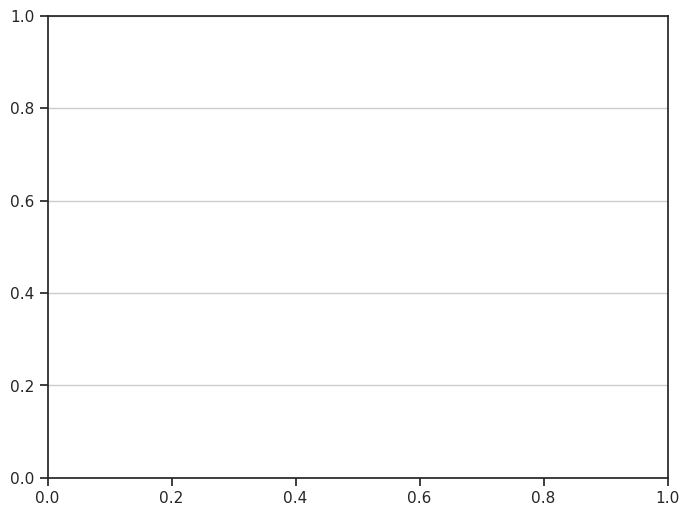

In [ ]:
# Create a subset of the DataFrame for the specific data
subset_df = df_agg.loc['cluster', '4pod', :, :, :, :]

# Set up the plot figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Set the plot style and color palette
sns.set_context("paper", font_scale = 1)
sns.set(style="ticks", palette="colorblind")

# Add horizontal grid lines
ax.yaxis.grid(True)


# Plot the line graph
sns.lineplot(data=subset_df, x='num_users', y='throughput_mean', hue='sorting', 
             markers=True, style='scenario', sort=False, col='flow_type', ax=ax)

# Set the axes labels and title
ax.set_xlabel('Number of Users')
ax.set_ylabel('Throughput Mean')
ax.set_title('Throughput Variation with Number of Users')

# Set the legend and its title outside the figure
legend = ax.legend(title='Sorting', loc='center left', bbox_to_anchor=(1, 0.5))
legend.get_title().set_fontsize('12')

# Remove the right and top spines
sns.despine()

<Axes: xlabel='num_users', ylabel='throughput_mean'>

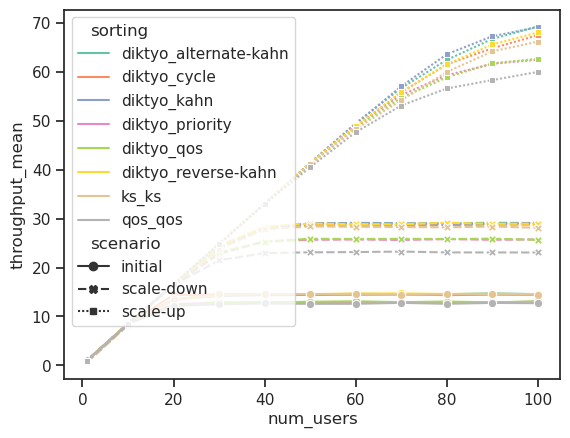

In [ ]:
# mask = (df_agg['topology'] == 'cluster') & (df_agg["deployment"] == "4pod")
sns.lineplot(
    df_agg.loc['cluster', '4pod', :, :, :, 'Benign'], 
    x='num_users', 
    y='throughput_mean', 
    hue='sorting', 
    markers=True, 
    style='scenario', 
    sort=False)
# plt.ylim([0, 2000])

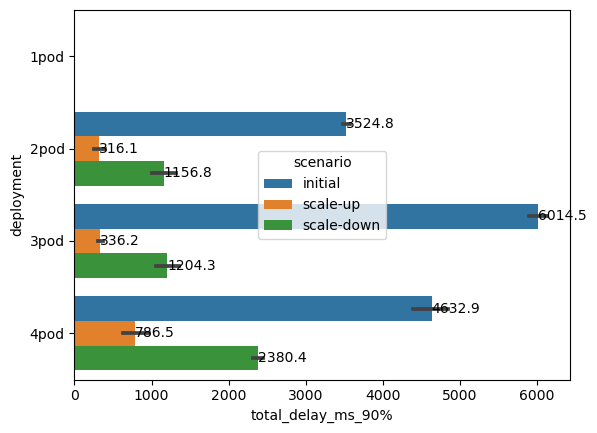

In [ ]:
mask = (df["topology"] == "cluster-delay") & (df["scheduler"] == "diktyo") & (df["sorting"] == "kahn") & (df["num_users"] == 70)
ax = sns.barplot(
    data=df[mask], 
    y="deployment", 
    x="total_delay_ms_90%", 
    hue="scenario",
    hue_order=["initial", "scale-up", "scale-down"])
for container in ax.containers:
    ax.bar_label(container, label_type='edge')
plt.show()

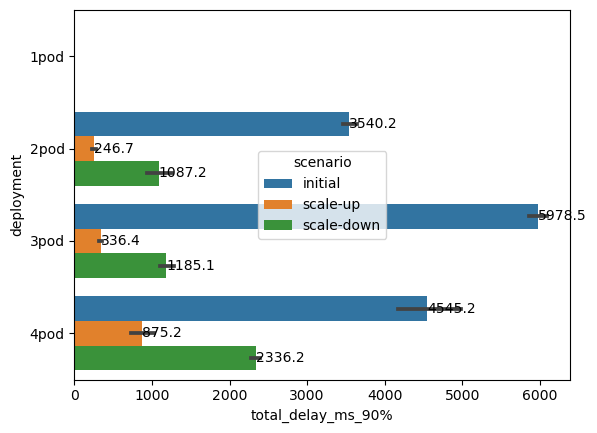

In [ ]:
mask = (df["topology"] == "cluster") & (df["scheduler"] == "diktyo") & (df["sorting"] == "kahn") & (df["num_users"] == 70)
ax = sns.barplot(
    data=df[mask], 
    y="deployment", 
    x="total_delay_ms_90%", 
    hue="scenario",
    hue_order=["initial", "scale-up", "scale-down"])
for container in ax.containers:
    ax.bar_label(container, label_type='edge')
plt.show()

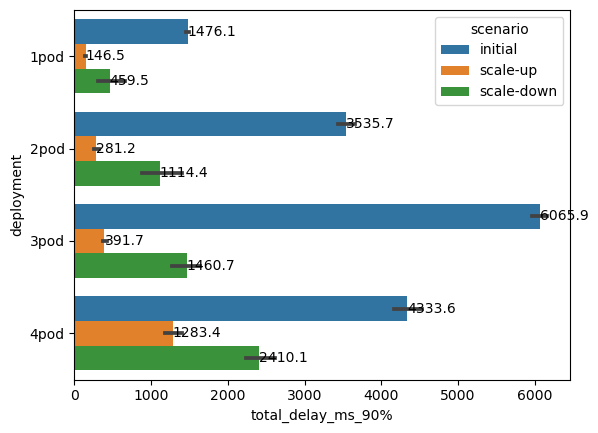

In [ ]:
mask = (df["topology"] == "cluster") & (df["scheduler"] == "ks") & (df["num_users"] == 70)
ax = sns.barplot(
    data=df[mask], 
    y="deployment", 
    x="total_delay_ms_90%", 
    hue="scenario",
    hue_order=["initial", "scale-up", "scale-down"])
for container in ax.containers:
    ax.bar_label(container, label_type='edge')
plt.show()

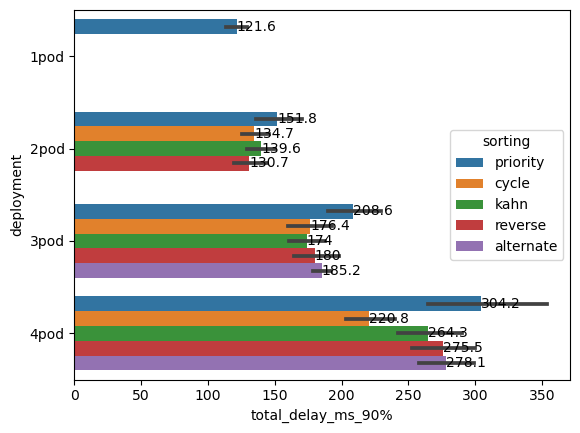

In [ ]:
mask = (df["topology"] == "cluster") & (df["scenario"] == "scale-up") & (df["num_users"] == 20)
ax = sns.barplot(
    data=df[mask], 
    y="deployment", 
    x="total_delay_ms_90%", 
    hue="sorting",
    hue_order=["priority", "cycle", "kahn", "reverse", "alternate"])
for container in ax.containers:
    ax.bar_label(container, label_type='edge')
plt.show()

<ErrorbarContainer object of 3 artists>

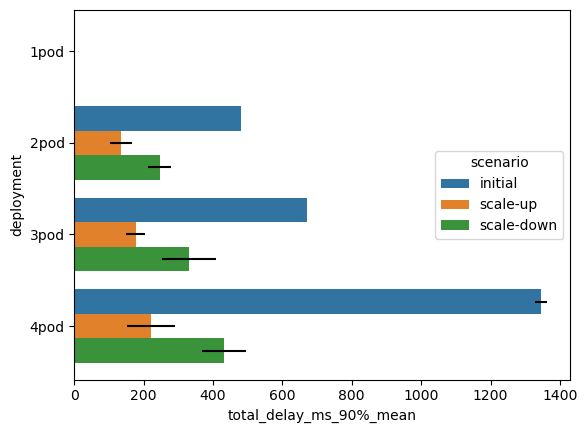

In [ ]:
mask = (df_agg["scheduler"] == "diktyo") & (df_agg["sorting"] == "cycle") & (df_agg["num_users"] == 20)
ax = sns.barplot(
    data=df_agg[mask], 
    y="deployment", 
    x="total_delay_ms_90%_mean", 
    hue="scenario",
    hue_order=["initial", "scale-up", "scale-down"])
# x_coords = [p.get_x() + 0.5 * p.get_width() for p in ax.patches]
# y_coords = [p.get_height() for p in ax.patches]
# yerr_values = [0] * (12 - df_agg.loc[mask, "total_delay_ms_90%_std"].count()) + df_agg.loc[mask, "total_delay_ms_90%_std"].tolist()
# ax.errorbar(x=x_coords, y=y_coords, yerr=yerr_values, fmt="none", c="k")
# Horizontal orientation
# x_coords = [p.get_width() for p in ax.patches]
# y_coords = [p.get_y() + 0.5* p.get_height() for p in ax.patches]
# xerr_values = [0] * (12 - df_agg.loc[mask, "total_delay_ms_90%_std"].count()) + df_agg.loc[mask, "total_delay_ms_90%_std"].tolist()
# ax.errorbar(x=x_coords, y=y_coords, xerr=xerr_values, fmt="none", c="k")

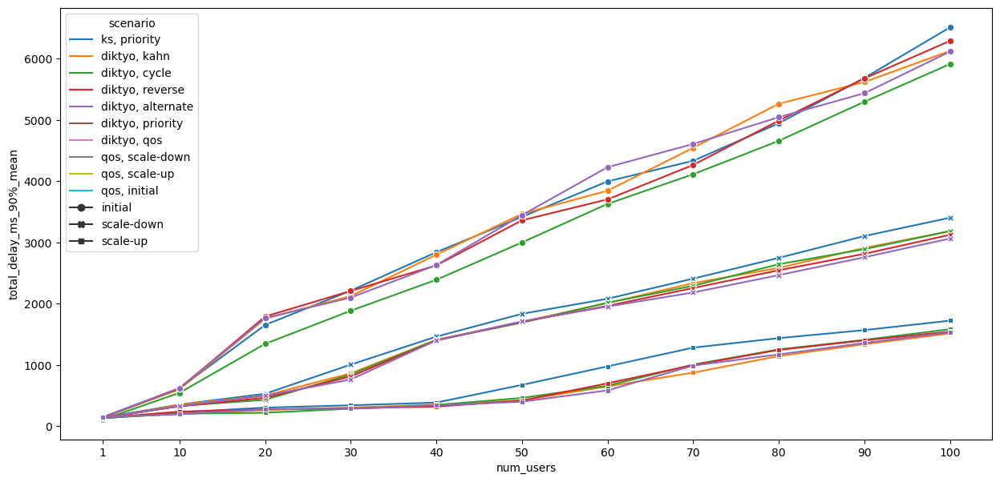

In [ ]:
plt.figure(figsize=[15,7])
hue = df_agg['scheduler'].astype(str) + ', ' + df_agg['sorting'].astype(str)
ax = sns.lineplot(
    df_agg[(df_agg.topology == 'cluster') & (df_agg.deployment == '4pod')], # & (df_agg.sorting.isin(['cycle', 'priority']))], 
    x='num_users', 
    y='total_delay_ms_90%_mean', 
    hue=hue, 
    markers=True, 
    dashes=False, 
    style='scenario', 
    legend='full')
# plt.legend(labels=['test1', 'test1', 'test1', 'test1'])
ax.set_xticks([1,10,20,30,40,50,60,70,80,90,100])
# plt.yscale('log')

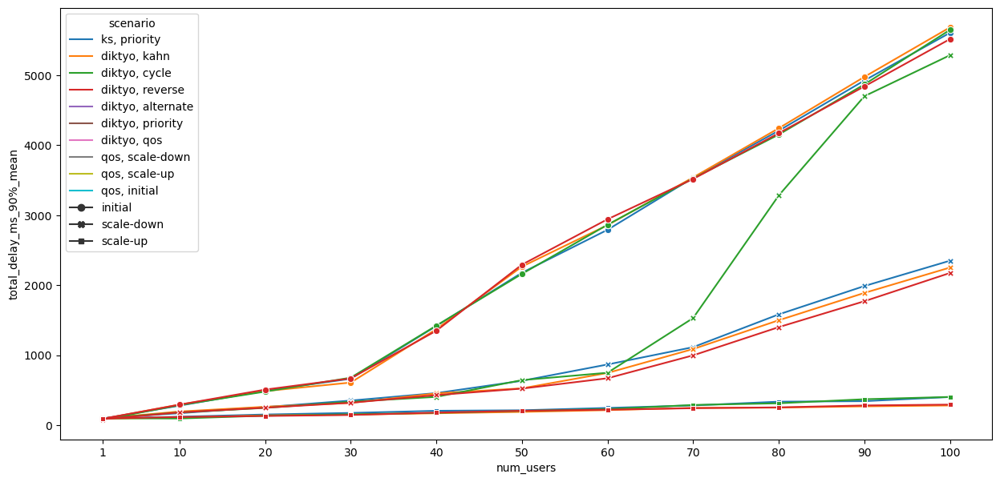

In [ ]:
plt.figure(figsize=[15,7])
hue = df_agg['scheduler'].astype(str) + ', ' + df_agg['sorting'].astype(str)
ax = sns.lineplot(
    df_agg[(df_agg.topology == 'cluster') & (df_agg.deployment == '2pod')], # & (df_agg.sorting.isin(['cycle', 'priority']))], 
    x='num_users', 
    y='total_delay_ms_90%_mean', 
    hue=hue, 
    markers=True, 
    dashes=False, 
    style='scenario', 
    legend='full')
# plt.legend(labels=['test1', 'test1', 'test1', 'test1'])
ax.set_xticks([1,10,20,30,40,50,60,70,80,90,100])
# plt.ylim([0,2000])
# plt.yscale('log')

## Throughput-Latency curve

In [ ]:
df_agg.columns

Index(['topology', 'deployment', 'scheduler', 'sorting', 'scenario',
       'num_users', 'total_delay_ms_count_mean', 'total_delay_ms_count_std',
       'total_delay_ms_mean_mean', 'total_delay_ms_mean_std',
       'total_delay_ms_min_mean', 'total_delay_ms_min_std',
       'total_delay_ms_25%_mean', 'total_delay_ms_25%_std',
       'total_delay_ms_50%_mean', 'total_delay_ms_50%_std',
       'total_delay_ms_75%_mean', 'total_delay_ms_75%_std',
       'total_delay_ms_90%_mean', 'total_delay_ms_90%_std',
       'total_delay_ms_95%_mean', 'total_delay_ms_95%_std',
       'total_delay_ms_99%_mean', 'total_delay_ms_99%_std',
       'total_delay_ms_max_mean', 'total_delay_ms_max_std', 'throughput_mean',
       'throughput_std'],
      dtype='object')

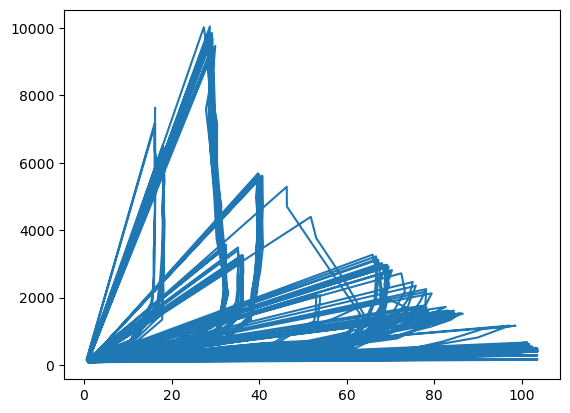

In [ ]:
plt.plot(df_agg['throughput_mean'], df_agg['total_delay_ms_90%_mean'])

(0.0, 2000.0)

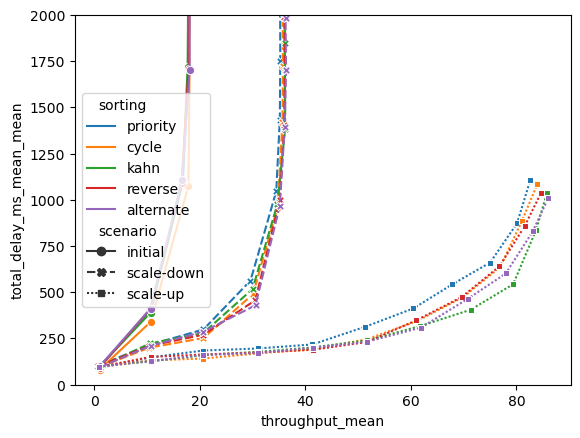

In [ ]:
mask = (df_agg['topology'] == 'cluster') & (df_agg["deployment"] == "4pod")
sns.lineplot(
    df_agg[mask], 
    x='throughput_mean', 
    y='total_delay_ms_mean_mean', 
    hue='sorting', 
    markers=True, 
    style='scenario', 
    sort=False,
    hue_order=["priority", "cycle", "kahn", "reverse", "alternate"])
plt.ylim([0, 2000])

In [ ]:
df_agg.loc[mask & (df_agg['scenario']== 'initial'), ['sorting', 'num_users', 'total_delay_ms_90%_mean', 'total_delay_ms_count_std', 'throughput_mean', 'throughput_std']]

,sorting,num_users,total_delay_ms_90%_mean,total_delay_ms_count_std,throughput_mean,throughput_std
176,priority,1,113.1,0.000000,1.000000,0.000000
177,priority,10,404.8,0.483046,10.676667,0.016102
178,priority,20,709.0,0.483046,20.676667,0.016102
179,priority,30,815.1,11.849051,30.760000,0.394968
180,priority,40,2183.0,27.957110,32.086667,0.931904
181,priority,50,3549.3,26.145745,31.013333,0.871525
182,priority,60,4728.8,42.076782,30.210000,1.402559
183,priority,70,6065.9,36.265073,30.046667,1.208836
184,priority,80,7419.9,41.183195,29.950000,1.372773
185,priority,90,8413.8,33.843430,29.680000,1.128114
